In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
import matplotlib.image as mpimg
from sklearn.cluster import KMeans
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

In [2]:
# kill_data = pd.read_csv('../dataset/kill_weapon.csv')
# kill_data1 = pd.read_csv('../dataset/kill_weapon_as-pcs1kr.csv')
# kill_data2 = pd.read_csv('../dataset/kill_weapon_as-pcs2kr.csv')
# kill_data3 = pd.read_csv('../dataset/kill_weapon_as-pcs3kr.csv')
# move_data = pd.read_csv('../dataset/all_movements.csv')
# wz_data = pd.read_csv('../dataset/white_zone_kr-bsc20.csv')
# wz_data1 = pd.read_csv('../dataset/white_zone_as-pcs1kr.csv')
# wz_data2 = pd.read_csv('../dataset/white_zone_as-pcs2kr.csv')
# wz_data3 = pd.read_csv('../dataset/white_zone_as-pcs3kr.csv')

# 타임스탬프가 아닌 4개 토너먼트의 프로데이터셋 
pro_data_0 = pd.read_csv('../dataset/pro_data2.csv')
pro_data_1 = pd.read_csv('../dataset/pro_data_as-pcs1kr.csv')
pro_data_2 = pd.read_csv('../dataset/pro_data_as-pcs2kr.csv')
pro_data_3 = pd.read_csv('../dataset/pro_data_as-pcs3kr.csv')

# 이상치 제거
outlier = ['618291a3-d2a6-4b33-be8a-0bcd96e7760a', '3bb55936-e760-45eb-a18d-3e8f50908f8b', 'f566ed1a-9187-4937-a435-3b31ed881f2d']
pro_data_0 = pro_data_0[~pro_data_0['match_id'].isin(outlier[:2])]
pro_data_1 = pro_data_1[~pro_data_1['match_id'].isin(outlier[2:])]

# 전체 토너먼트의 프로데이터셋
total_pro_data = pd.concat([pro_data_0, pro_data_1, pro_data_2, pro_data_3], axis=0)

# 에란겔(map1)과 미라마(map2)의 킬데이터셋
map1 = pd.read_csv('../dataset/Baltic_kill_clustered_rank.csv')
map2 = pd.read_csv('../dataset/Desert_kill_clustered_rank.csv')

# 데이터 전처리

### 1. 킬 데이터셋과 이동 데이터셋의 이상치 제거

In [3]:
total_pro_data = pd.concat([pro_data_0, pro_data_1, pro_data_2, pro_data_3], axis=0)

# 각 매치에 몇 명의 플레이어가 참가했는지의 분포를 파악
match_player_counts = total_pro_data['match_id'].value_counts()

# 그 분포의 빈도수 계산
distribution_counts = match_player_counts.value_counts().sort_index()

# 결과 출력
for players, matches in distribution_counts.items():
    print(f"플레이어 수가 {players} 명인 매칭 : {matches} 개\n")

플레이어 수가 4 명인 매칭 : 1 개

플레이어 수가 56 명인 매칭 : 1 개

플레이어 수가 59 명인 매칭 : 1 개

플레이어 수가 60 명인 매칭 : 3 개

플레이어 수가 63 명인 매칭 : 1 개

플레이어 수가 64 명인 매칭 : 172 개



In [4]:
pro_data_0 = pro_data_0[pro_data_0['map_name'].isin(['Erangel (Remastered)', 'Miramar'])]
pro_data_1 = pro_data_1[pro_data_1['map_name'].isin(['Erangel (Remastered)', 'Miramar'])]
pro_data_2 = pro_data_2[pro_data_2['map_name'].isin(['Erangel (Remastered)', 'Miramar'])]
pro_data_3 = pro_data_3[pro_data_3['map_name'].isin(['Erangel (Remastered)', 'Miramar'])]

dataframes = {'pro_data_0': pro_data_0, 'pro_data_1': pro_data_1, 'pro_data_2': pro_data_2, 'pro_data_3': pro_data_3}

for df_name, df in dataframes.items():
    value_counts = df['match_id'].value_counts()
    
    max_value = value_counts.max()
    threshold = max_value * 0.8
    
    # 이상치에 해당하는 매칭들을 찾음
    outliers = value_counts[value_counts <= threshold].index.tolist()
    
    if outliers:
        print(f"최대 64명 중 80% 이하의 플레이어들로 매치되어 {df_name}의 이상치로 판단한 매칭 ID : \n{outliers}\n\n")
    else:
        print(f"{df_name} 에서 이상치로 추정되는 매칭 ID가 없음\n")

pro_data_0 에서 이상치로 추정되는 매칭 ID가 없음

pro_data_1 에서 이상치로 추정되는 매칭 ID가 없음

pro_data_2 에서 이상치로 추정되는 매칭 ID가 없음

pro_data_3 에서 이상치로 추정되는 매칭 ID가 없음



### 2. 킬 데이터셋과 이동 데이터셋에서 가장 데이터가 많은 미라마 맵(Desert_Main), 에란겔 맵(Baltic_Main) 분리

In [5]:
# # # 킬데이터셋과 이동데이터셋에서의 맵 분포 확인
# # print(kill_data['map_name'].value_counts(), "\n")
# # print(move_data['map_name'].value_counts(), "\n")

# # 미라마 맵(Desert_Main), 에란겔 맵(Baltic_Main) 분리
# kill_map1_data = kill_data[kill_data['map_name'].isin(['Desert_Main'])]
# kill_map2_data = kill_data[kill_data['map_name'].isin(['Baltic_Main'])]
# move_map1_data = move_data[move_data['map_name'].isin(['Desert_Main'])]
# move_map2_data = move_data[move_data['map_name'].isin(['Baltic_Main'])]

# print("킬 데이터셋에서 미라마 맵만 추출함:\n", kill_map1_data['map_name'].value_counts(), "\n")
# print("킬 데이터셋에서 에란겔 맵만 추출함:\n", kill_map2_data['map_name'].value_counts(), "\n")
# print("이동 데이터셋에서 미라마 맵만 추출함:\n", move_map1_data['map_name'].value_counts(), "\n")
# print("이동 데이터셋에서 에란겔 맵만 추출함:\n", move_map2_data['map_name'].value_counts(), "\n")

# 자기장별 클러스터링

In [6]:
kill_map1 = pd.read_csv('../dataset/Baltic_kill_clustered_rank.csv')
kill_map2 = pd.read_csv('../dataset/Desert_kill_clustered_rank.csv')
wz_map1 = pd.read_csv('../dataset/Baltic_wz_clustered.csv')
wz_map2 = pd.read_csv('../dataset/Desert_wz_clustered.csv')

Dessert맵이든 Baltic맵이든 경기 13분째부터 1분간 반지름이 1.27538km로 고정됨
<br>
1. 초기부터 2번째로 자기장이 고정되는 순간의 자기장 중심들을 모은다 -> wz_center_map1, wz_center_map2
2. 자기장 중심들이 몰리는 매칭끼리 분류한다

In [7]:
# 'radius'가 127538.1171875인 첫 번째 행을 찾는 함수 정의 
def find_radius_match(group):
    return group[group['radius'] == 127538.1171875].iloc[0]

# 'match_id'별로 그룹화하여 'radius'가 231887.484375인 첫 번째 행 찾기
radius_matches_map1 = wz_map1.groupby('match_id').apply(find_radius_match)
radius_matches_map2 = wz_map2.groupby('match_id').apply(find_radius_match)

# 컬럼 'match_id', 'center_x', 'center_y'만 선택
wz_center_map1 = radius_matches_map1[['match_id', 'center_x', 'center_y']].reset_index(drop=True)
wz_center_map2 = radius_matches_map2[['match_id', 'center_x', 'center_y']].reset_index(drop=True)

# 원본 순서 유지: 원본 wz_map1의 'match_id' 순서에 따라 정렬
original_order_map1 = wz_map1[['match_id']].drop_duplicates()
wz_center_map1 = original_order_map1.merge(wz_center_map1, on='match_id', how='left')
original_order_map2 = wz_map2[['match_id']].drop_duplicates()
wz_center_map2 = original_order_map2.merge(wz_center_map2, on='match_id', how='left')

# 결과 출력
print(wz_center_map1)
print(wz_center_map2)

                                match_id       center_x      center_y
0   59ade283-0d45-49fc-8fd1-38f97289be81  112591.257812  409425.53125
1   9dbed8c0-a780-4eb0-a377-c8b6239f5821  283883.968750  443242.90625
2   bad3416a-1efb-46a7-80a1-39a34e4c2ad5  277144.031250  342385.28125
3   76f43e88-db68-4697-be1a-7f2d91508e9d  624896.687500  361392.87500
4   8302d4e0-abca-4a87-b695-e5773950fb0c  181590.890625  361710.25000
..                                   ...            ...           ...
75  9f71cf10-cb9b-46e0-87a0-555aa21f8064  194891.062500  351408.34375
76  a9930567-5747-4b5c-a92c-786514b65261  447896.656250  729795.75000
77  2acb671d-e1d0-45da-b600-c17c79b009b0  184166.531250  341054.90625
78  1d60c71c-f2ad-47f9-8ba7-dc74d675e32f  467464.437500  565712.06250
79  8f64319d-f8e3-4df5-a052-1092d2d094cf  161593.406250  486878.93750

[80 rows x 3 columns]
                                match_id      center_x      center_y
0   f44bc3d8-f763-49e0-82cc-88b16d64d987  165433.71875  268572.37500

In [8]:
# # 에란겔 맵의 80건 매칭에 대한 중심점 분포
# map_x = 816000
# map_y = 816000

# erangel_img = mpimg.imread('../dataset/erangel.jpg')

# fig, ax = plt.subplots(figsize=(30, 30), dpi=100)
# ax.imshow(erangel_img, extent=[0, map_x, 0, map_y])-
# # y좌표 반전하여 점 그리기
# ax.scatter(wz_center_map1['center_x'], map_y - wz_center_map1['center_y'], c='red', s=100)  # c는 색상, s는 점의 크기

# # 축 설정
# ax.set_xlim(0, map_x)
# ax.set_ylim(0, map_y)
# plt.show()

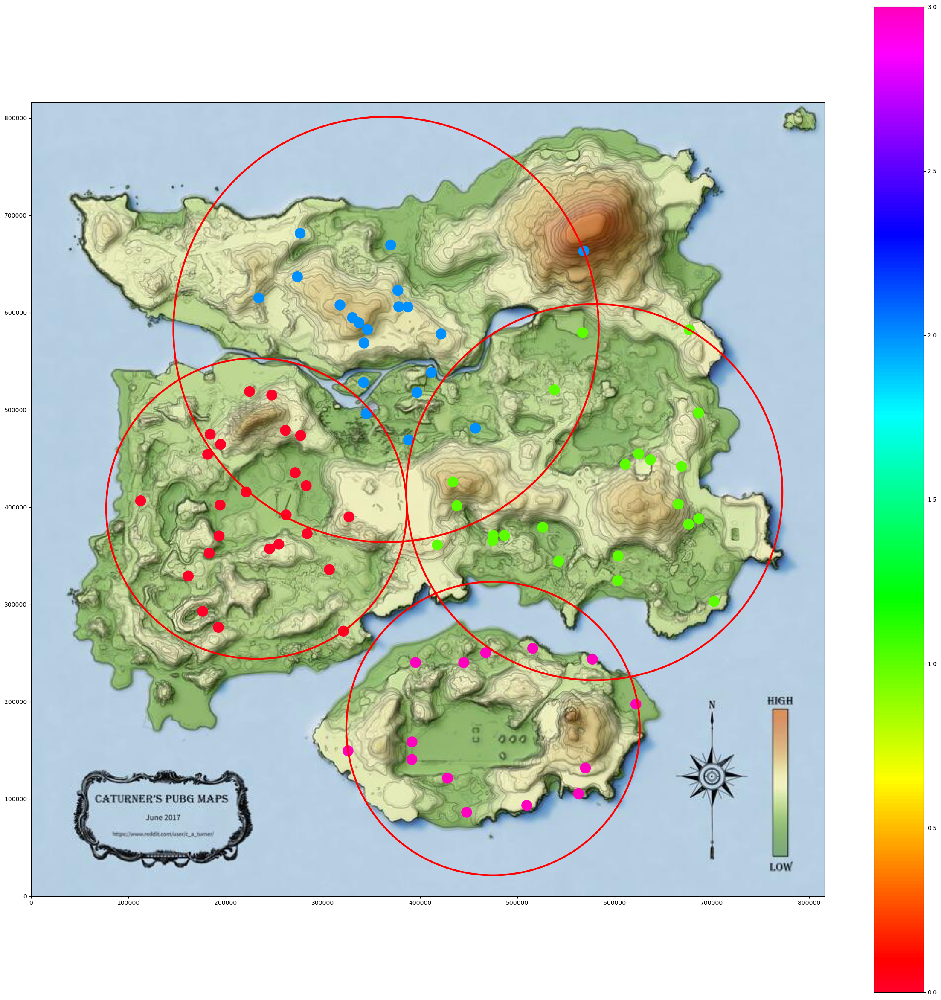

0    24
1    22
2    20
3    14
Name: cluster_4, dtype: int64


In [9]:
from matplotlib.patches import Circle

# KMeans 모델 생성 및 학습
kmeans = KMeans(n_clusters=4, random_state=0).fit(wz_center_map1[['center_x', 'center_y']])

# 군집 결과를 데이터프레임에 추가
wz_center_map1['cluster_4'] = kmeans.labels_

cluster_sizes = wz_center_map1['cluster_4'].value_counts().sort_values(ascending=False).index
new_labels = {old_label: new_label for new_label, old_label in enumerate(cluster_sizes)}
wz_center_map1['cluster_4'] = wz_center_map1['cluster_4'].map(new_labels)

map_x = 816000
map_y = 816000

# erangel_img = mpimg.imread('../dataset/erangel.jpg')
erangel_img = mpimg.imread('../dataset/erangel2.jpg')

fig, ax = plt.subplots(figsize=(30, 30), dpi=100)
ax.imshow(erangel_img, extent=[0, map_x, 0, map_y])
scatter = ax.scatter(wz_center_map1['center_x'], map_y - wz_center_map1['center_y'], c=wz_center_map1['cluster_4'], s=300, cmap='gist_rainbow')  # y좌표 반전하여 점 그리기

# 군집 중심점 및 반지름 계산 및 시각화
for cluster in wz_center_map1['cluster_4'].unique():
    cluster_points = wz_center_map1[wz_center_map1['cluster_4'] == cluster]
    center_x = cluster_points['center_x'].mean()
    center_y = cluster_points['center_y'].mean()
    radius = np.sqrt(((cluster_points['center_x'] - center_x) ** 2 + (cluster_points['center_y'] - center_y) ** 2).max())
    
    circle = Circle((center_x, map_y - center_y), radius, color='r', fill=False, linewidth=3)
    ax.add_patch(circle)

# 축 설정
ax.set_xlim(0, map_x)
ax.set_ylim(0, map_y)
plt.colorbar(scatter)
plt.show()

print(wz_center_map1['cluster_4'].value_counts())

In [11]:
kill_map1 = pd.merge(kill_map1, wz_center_map1[['match_id', 'cluster_4']], on='match_id', how='left')
kill_map1.to_csv('Baltic_kill_clustered_rank.csv', index=False)

In [13]:
wz_map1 = pd.merge(wz_map1, wz_center_map1[['match_id', 'cluster_4']], on='match_id', how='left')
wz_map1.to_csv('Baltic_wz_clustered.csv', index=False)

In [14]:
# # 미라마 맵의 83건 매칭에 대한 중심점 분포
# map_x = 816000
# map_y = 816000

# mirama_img = mpimg.imread('../dataset/mirama.jpg')

# fig, ax = plt.subplots(figsize=(30, 30), dpi=100)
# ax.imshow(mirama_img, extent=[0, map_x, 0, map_y])  
# # y좌표 반전하여 점 그리기
# ax.scatter(wz_center_map2['center_x'], map_y - wz_center_map2['center_y'], c='red', s=100)  # c는 색상, s는 점의 크기

# ax.set_xlim(0, map_x)
# ax.set_ylim(0, map_y)
# plt.show()

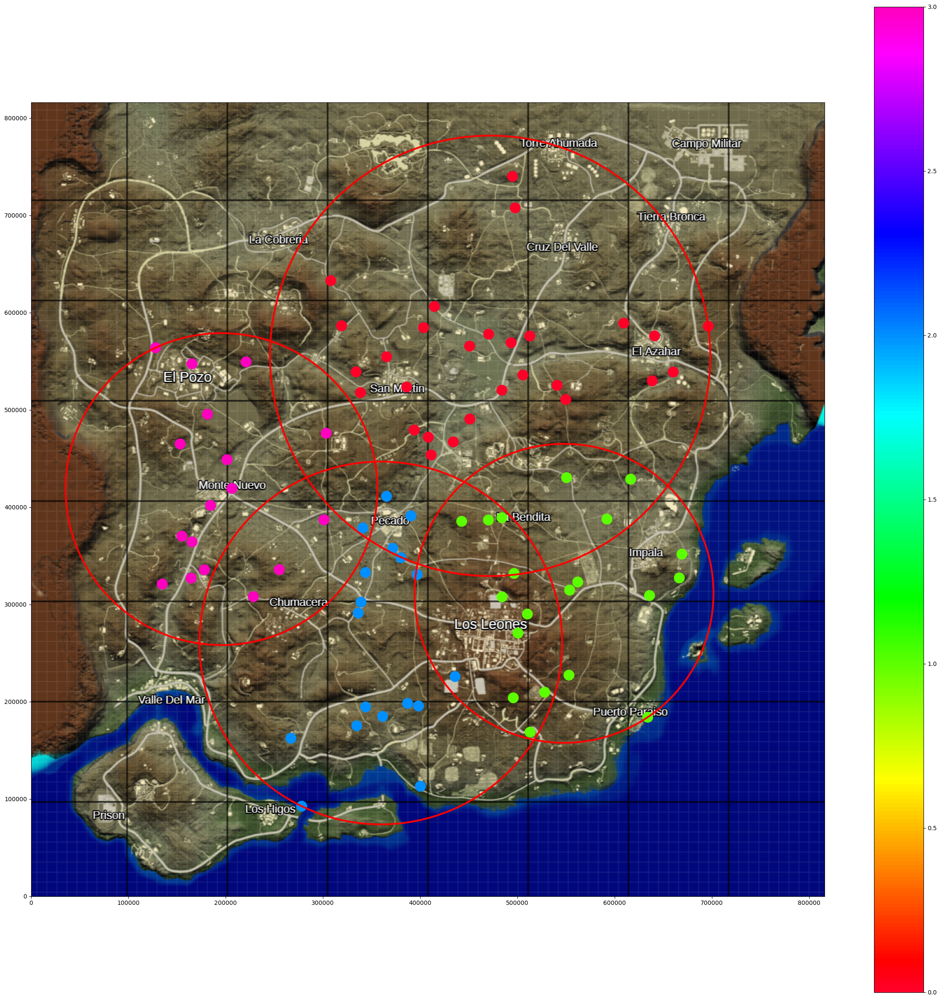

0    28
1    20
2    18
3    17
Name: cluster_4, dtype: int64


In [15]:
# KMeans 모델 생성 및 학습
kmeans = KMeans(n_clusters=4, random_state=0).fit(wz_center_map2[['center_x', 'center_y']])

# 군집 결과를 데이터프레임에 추가
wz_center_map2['cluster_4'] = kmeans.labels_

cluster_sizes = wz_center_map2['cluster_4'].value_counts().sort_values(ascending=False).index
new_labels = {old_label: new_label for new_label, old_label in enumerate(cluster_sizes)}
wz_center_map2['cluster_4'] = wz_center_map2['cluster_4'].map(new_labels)

map_x = 816000
map_y = 816000

# mirama_img = mpimg.imread('../dataset/mirama.jpg')
mirama_img = mpimg.imread('../dataset/mirama2.png')

fig, ax = plt.subplots(figsize=(30, 30), dpi=100)
ax.imshow(mirama_img, extent=[0, map_x, 0, map_y])  
scatter = ax.scatter(wz_center_map2['center_x'], map_y - wz_center_map2['center_y'], c=wz_center_map2['cluster_4'], s=300, cmap='gist_rainbow')  # y좌표 반전하여 점 그리기

# 군집 중심점 및 반지름 계산 및 시각화
for cluster in wz_center_map2['cluster_4'].unique():
    cluster_points = wz_center_map2[wz_center_map2['cluster_4'] == cluster]
    center_x = cluster_points['center_x'].mean()
    center_y = cluster_points['center_y'].mean()
    radius = np.sqrt(((cluster_points['center_x'] - center_x) ** 2 + (cluster_points['center_y'] - center_y) ** 2).max())
    
    circle = Circle((center_x, map_y - center_y), radius, color='r', fill=False, linewidth=3)
    ax.add_patch(circle)

ax.set_xlim(0, map_x)
ax.set_ylim(0, map_y)
plt.colorbar(scatter)
plt.show()

print(wz_center_map2['cluster_4'].value_counts())

In [17]:
kill_map2 = pd.merge(kill_map2, wz_center_map2[['match_id', 'cluster_4']], on='match_id', how='left')
# kill_map2 = pd.merge(kill_map2, wz_center_map2[['match_id', 'cluster_6']], on='match_id', how='left')
kill_map2.to_csv('Desert_kill_clustered_rank.csv', index=False)

In [19]:
wz_map2 = pd.merge(wz_map2, wz_center_map2[['match_id', 'cluster_4']], on='match_id', how='left')
# wz_map2 = pd.merge(wz_map2, wz_center_map2[['match_id', 'cluster_6']], on='match_id', how='left')
wz_map2.to_csv('Desert_wz_clustered.csv', index=False)

# 마지막 자기장 중심 시각화

In [20]:
kill_map1 = pd.read_csv('../dataset/Baltic_kill_clustered_rank.csv')
kill_map2 = pd.read_csv('../dataset/Desert_kill_clustered_rank.csv')
wz_map1 = pd.read_csv('../dataset/Baltic_wz_clustered.csv')
wz_map2 = pd.read_csv('../dataset/Desert_wz_clustered.csv')

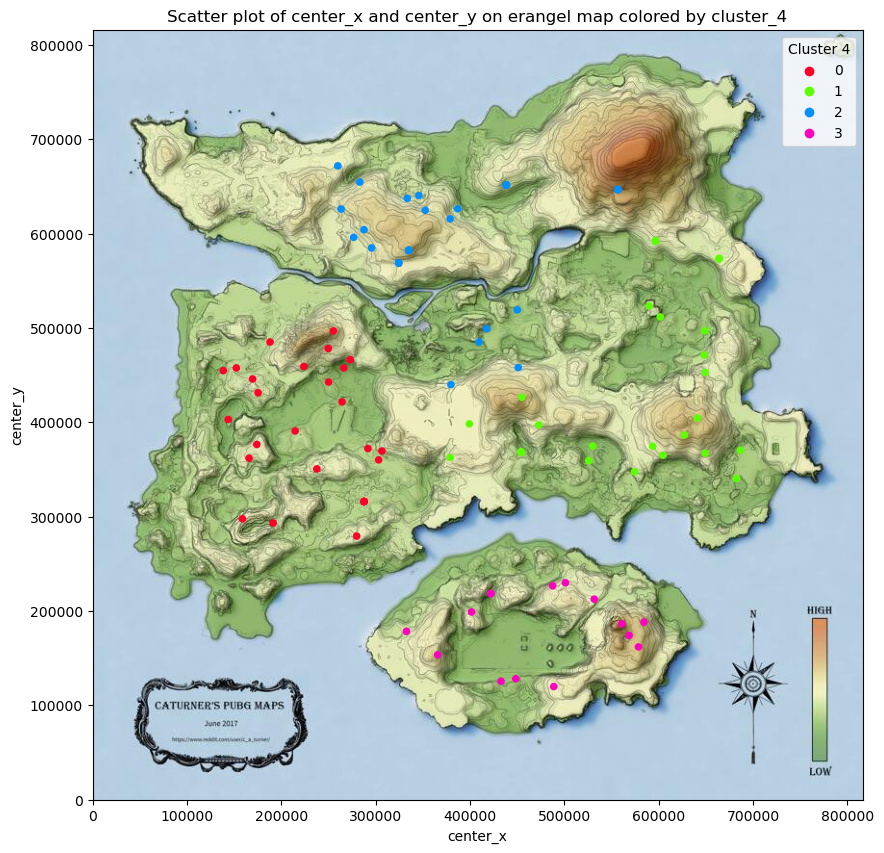

In [21]:
# 'match_id'별로 그룹화하여 'radius'의 최솟값을 계산
min_radius_per_match = wz_map1.groupby('match_id')['radius'].min().reset_index()

# 원본 데이터프레임과 최솟값 데이터프레임을 병합
merged_df = pd.merge(wz_map1, min_radius_per_match, on=['match_id', 'radius'])
result_df = merged_df[['match_id', 'center_x', 'center_y', 'cluster_4']]

# 원본 순서 유지: 원본 wz_map1의 'match_id' 순서에 따라 정렬
order_map1 = wz_map1[['match_id']].drop_duplicates()
result_df = original_order_map1.merge(result_df, on='match_id', how='left')

# 이미지 로드
# erangel_img = mpimg.imread('../dataset/erangel.jpg')
erangel_img = mpimg.imread('../dataset/erangel2.jpg')

# 시각화
plt.figure(figsize=(10, 10))
plt.imshow(erangel_img, extent=[0, 816000, 0, 816000])  # extent=[left, right, bottom, top]

# 산점도 그리기
result_df['inverted_center_y'] = 816000 - result_df['center_y']
sns.scatterplot(data=result_df, x='center_x', y='inverted_center_y', hue='cluster_4', palette='gist_rainbow', s=30, edgecolor='none')

# 그래프 설정
plt.title('Scatter plot of center_x and center_y on erangel map colored by cluster_4')
plt.xlabel('center_x')
plt.ylabel('center_y')
plt.xlim(0, 816000)
plt.ylim(0, 816000)
plt.legend(title='Cluster 4')
plt.show()

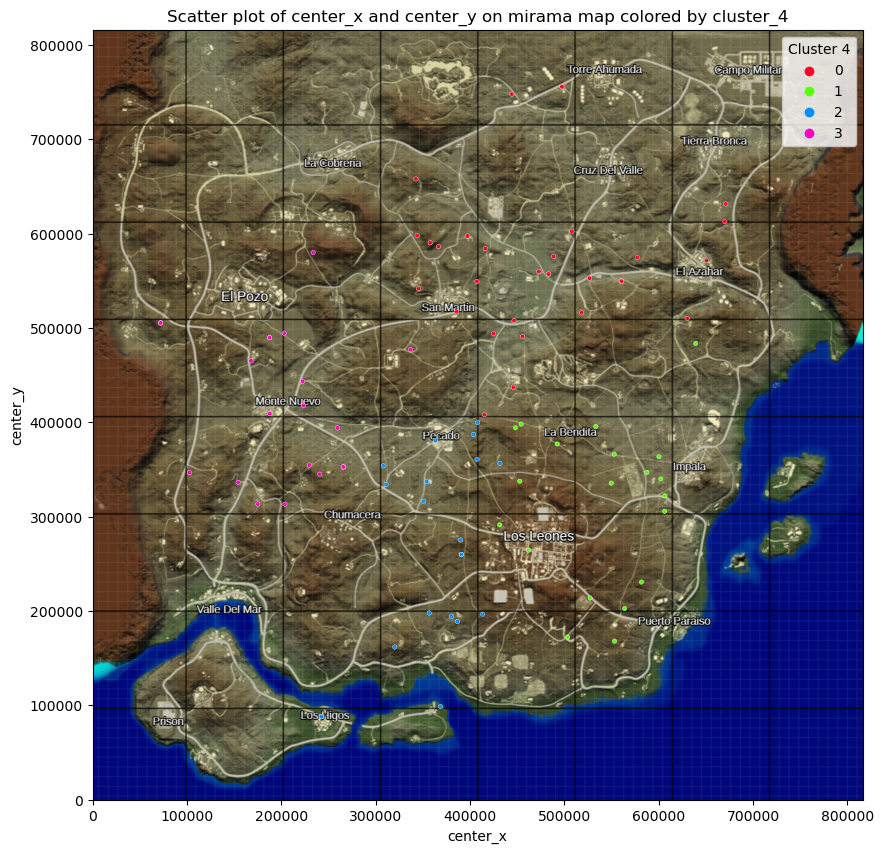

In [22]:
# 'match_id'별로 그룹화하여 'radius'의 최솟값을 계산
min_radius_per_match2 = wz_map2.groupby('match_id')['radius'].min().reset_index()

# 원본 데이터프레임과 최솟값 데이터프레임을 병합
merged_df2 = pd.merge(wz_map2, min_radius_per_match2, on=['match_id', 'radius'])
result_df2 = merged_df2[['match_id', 'center_x', 'center_y', 'cluster_4']]

# 원본 순서 유지: 원본 wz_map1의 'match_id' 순서에 따라 정렬
order_map2 = wz_map2[['match_id']].drop_duplicates()
result_df2 = order_map2.merge(result_df2, on='match_id', how='left')

# 이미지 로드
# mirama_img = mpimg.imread('../dataset/mirama.jpg')
mirama_img = mpimg.imread('../dataset/mirama2.png')

# 시각화
plt.figure(figsize=(10, 10))
plt.imshow(mirama_img, extent=[0, 816000, 0, 816000])  # extent=[left, right, bottom, top]

# 산점도 그리기
result_df2['inverted_center_y'] = 816000 - result_df2['center_y']
sns.scatterplot(data=result_df2, x='center_x', y='inverted_center_y', hue='cluster_4', palette='gist_rainbow', s=10, edgecolor='white')

# 그래프 설정
plt.title('Scatter plot of center_x and center_y on mirama map colored by cluster_4')
plt.xlabel('center_x')
plt.ylabel('center_y')
plt.xlim(0, 816000)
plt.ylim(0, 816000)
plt.legend(title='Cluster 4')
plt.show()